In [1]:
# set up enviroment
import numpy as np
import pandas as pd 
import scanpy as sc

%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns

from sklearn.manifold import TSNE
import sklearn

pd.options.mode.chained_assignment = None  # default='warn'

In [2]:
def load_list(infile):
    X = []
    with open(infile) as f:
        for line in f:
            X.append(line.rstrip())
    return X
CSMs = load_list("../resources/CSMs.txt")
TFs = load_list("../resources/TFs.txt")
TFs.remove('Ptp99A')

In [3]:
adata_all = sc.read_h5ad('../data/adata_all_panPN_annotated_final.h5ad')
adata_all

AnnData object with n_obs × n_vars = 3633 × 17474
    obs: 'batch', 'genotype', 'stage', 'n_counts', 'n_genes', 'PN_type', 'MARS', 'HDBSCAN', 'MARS_2way_matched', 'MARS_2way_matched_PN_type', 'lineage', '24h_HDBSCAN', 'matched_type_with_stage', 'mannually_matched'
    var: 'highly_variable'
    uns: '24h_HDBSCAN_colors', 'HDBSCAN_colors', 'MARS_2way_matched_PN_type_colors', 'MARS_2way_matched_colors', 'MARS_colors', 'PN_type_colors', 'mannually_matched_colors', 'stage_colors'
    obsm: 'X_tsne'

# plot number of genes

In [4]:
# import DE genes at each stage among all PN types
DE_0h_all = set(line.strip() for line in open('../output/0h_APF_pval10E-2.txt'))
DE_24h_all = set(line.strip() for line in open('../output/24h_APF_pval10E-2.txt'))
DE_48h_all = set(line.strip() for line in open('../output/48h_pval10E-2.txt'))
DE_adult_all = set(line.strip() for line in open('../output/adult_pval10E-2.txt'))

In [5]:
# import DE genes at each stage for  only the 12 types decoded in all
DE_0h = set(line.strip() for line in open('../output/DE_12type/0h_DE.txt'))
DE_24h = set(line.strip() for line in open('../output/DE_12type/24h_DE.txt'))
DE_48h = set(line.strip() for line in open('../output/DE_12type/48h_DE.txt'))
DE_adult = set(line.strip() for line in open('../output/DE_12type/adult_DE.txt'))

In [6]:
shared_all = set.intersection(DE_0h_all, DE_24h_all, DE_48h_all, DE_adult_all)
shared_12 = set.intersection(DE_0h, DE_24h, DE_48h, DE_adult)

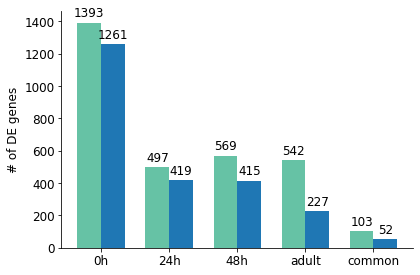

In [7]:
labels = ['0h', '24h', '48h', 'adult', 'common']
PN_all_means = [len(DE_0h_all), len(DE_24h_all), len(DE_48h_all), len(DE_adult_all), len(shared_all)]
PN_12_means = [len(DE_0h), len(DE_24h), len(DE_48h), len(DE_adult), len(shared_12)]
plt.rcParams.update({'font.size': 12, 'font.weight':100})
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, PN_all_means, width, label='all PN types', color='#66c2a5')
rects2 = ax.bar(x + width/2, PN_12_means, width, label='12 decoded PN types', color='#1f77b4')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('# of DE genes')
ax.set_xticks(x)
ax.set_xticklabels(labels)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom',fontsize=12)

autolabel(rects1)
autolabel(rects2)
fig.tight_layout()

# plt.savefig('../figure/figure9/number_DE_genes.pdf')

In [8]:
CSMs_percent = (100*len(set(CSMs).intersection(shared_all))/(len(shared_all)), 
                100*len(set(CSMs).intersection(shared_12))/(len(shared_12)),
                100*len(CSMs)/len(adata_all.var_names))
TFs_percent = (100*len(set(TFs).intersection(shared_all))/(len(shared_all)), 
               100*len(set(TFs).intersection(shared_12))/(len(shared_12)),
               100*len(TFs)/len(adata_all.var_names))

In [9]:
rest_percent = []
for i in range(3):
    curr_rest = 100 - CSMs_percent[i] - TFs_percent[i]
    rest_percent.append(curr_rest)
rest_percent = tuple(rest_percent)

In [10]:
rest_start = []
for i in range(3):
    rest_start.append(TFs_percent[i] + CSMs_percent[i])
rest_start = tuple(rest_start)

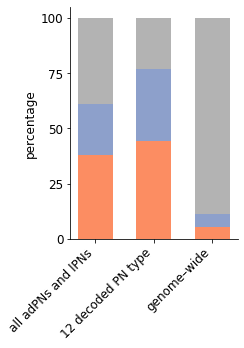

In [11]:
CSMs_percent = (100*len(set(CSMs).intersection(shared_all))/(len(shared_all)), 
                100*len(set(CSMs).intersection(shared_12))/(len(shared_12)),
                100*len(CSMs)/len(adata_all.var_names))
TFs_percent = (100*len(set(TFs).intersection(shared_all))/(len(shared_all)), 
               100*len(set(TFs).intersection(shared_12))/(len(shared_12)),
               100*len(TFs)/len(adata_all.var_names))
ind = np.arange(0,1.5,0.5)    # the x locations for the groups
width = 0.3       # the width of the bars: can also be len(x) sequence
plt.rcParams.update({'font.size': 12, 'font.weight':100})
fig, ax = plt.subplots(figsize=(3.5,5))

p1 = plt.bar(ind, CSMs_percent, width, color='#fc8d62')
p2 = plt.bar(ind, TFs_percent, width, bottom=CSMs_percent, color='#8da0cb')
p3 = plt.bar(ind, rest_percent, width, bottom=rest_start, color='#b3b3b3')

plt.ylabel('percentage')
plt.xticks(ind, ('all adPNs and lPNs', '12 decoded PN type', 'genome–wide'), rotation=45, ha='right')
plt.yticks(np.arange(0, 101, 25))

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

fig.tight_layout()

# plt.savefig('../figure/figure9/percentage_CSMs_TFs.pdf',bbox='tight')

# get only 12 decoded PN type and subset data

In [12]:
PN_type_12 = ['VA6','DL1','D','DC3','VA1d','DC3 and VA1d','VM7 or VM5v #1','VM2','VA1v','VM7 or VM5v #2',
              'VC2','DA1_fru+','DA1_fru-','DA1']

In [13]:
adata_all = adata_all[adata_all.obs.PN_type.isin(PN_type_12)]

In [14]:
PN_type_stage = []
for PN_type in PN_type_12:
    for stage in ['0h', '24h', '48h', 'adult']:
        if PN_type not in ['DA1', 'DC3 and VA1d']:
            PN_type_stage.append(PN_type+'_'+stage)

In [15]:
print(PN_type_stage)

['VA6_0h', 'VA6_24h', 'VA6_48h', 'VA6_adult', 'DL1_0h', 'DL1_24h', 'DL1_48h', 'DL1_adult', 'D_0h', 'D_24h', 'D_48h', 'D_adult', 'DC3_0h', 'DC3_24h', 'DC3_48h', 'DC3_adult', 'VA1d_0h', 'VA1d_24h', 'VA1d_48h', 'VA1d_adult', 'VM7 or VM5v #1_0h', 'VM7 or VM5v #1_24h', 'VM7 or VM5v #1_48h', 'VM7 or VM5v #1_adult', 'VM2_0h', 'VM2_24h', 'VM2_48h', 'VM2_adult', 'VA1v_0h', 'VA1v_24h', 'VA1v_48h', 'VA1v_adult', 'VM7 or VM5v #2_0h', 'VM7 or VM5v #2_24h', 'VM7 or VM5v #2_48h', 'VM7 or VM5v #2_adult', 'VC2_0h', 'VC2_24h', 'VC2_48h', 'VC2_adult', 'DA1_fru+_0h', 'DA1_fru+_24h', 'DA1_fru+_48h', 'DA1_fru+_adult', 'DA1_fru-_0h', 'DA1_fru-_24h', 'DA1_fru-_48h', 'DA1_fru-_adult']


In [16]:
adata_all.obs.matched_type_with_stage = adata_all.obs['PN_type'].str.cat(adata_all.obs['stage'], sep='_')
adata_all.obs['matched_type_with_stage'] = adata_all.obs['matched_type_with_stage'].astype('category')

Trying to set attribute `.obs` of view, copying.


In [17]:
adata_merged_type = adata_all[(adata_all.obs.matched_type_with_stage == 'DC3 and VA1d_adult') | 
                              (adata_all.obs.matched_type_with_stage == 'DA1_adult')]
adata_merged_type.obs.matched_type_with_stage.cat.rename_categories({'DC3 and VA1d_adult':'DC3_adult',
                                                                     'DA1_adult':'DA1_fru+_adult'}, inplace=True)
adata_all.obs.matched_type_with_stage.cat.rename_categories({'DC3 and VA1d_adult':'VA1d_adult',
                                                             'DA1_adult':'DA1_fru-_adult'}, inplace=True)

In [18]:
adata_dup = adata_all.concatenate(adata_merged_type)
adata_dup.obs.matched_type_with_stage = adata_dup.obs.matched_type_with_stage.astype('category')

In [19]:
adata_dup.obs.matched_type_with_stage.cat.reorder_categories(PN_type_stage, inplace=True)

In [20]:
adata_dup

AnnData object with n_obs × n_vars = 1600 × 17474
    obs: 'batch', 'genotype', 'stage', 'n_counts', 'n_genes', 'PN_type', 'MARS', 'HDBSCAN', 'MARS_2way_matched', 'MARS_2way_matched_PN_type', 'lineage', '24h_HDBSCAN', 'matched_type_with_stage', 'mannually_matched'
    var: 'highly_variable'
    obsm: 'X_tsne'

# plot common CSMs and TFs

In [21]:
common_CSMs = list(set(shared_12).intersection(CSMs))
common_CSMs = sorted(common_CSMs, key=lambda s: s.lower())
len(common_CSMs)

23

... storing 'genotype' as categorical
... storing 'stage' as categorical
... storing 'PN_type' as categorical
... storing 'MARS' as categorical
... storing 'HDBSCAN' as categorical
... storing 'MARS_2way_matched' as categorical
... storing 'MARS_2way_matched_PN_type' as categorical
... storing 'lineage' as categorical
... storing '24h_HDBSCAN' as categorical
... storing 'mannually_matched' as categorical


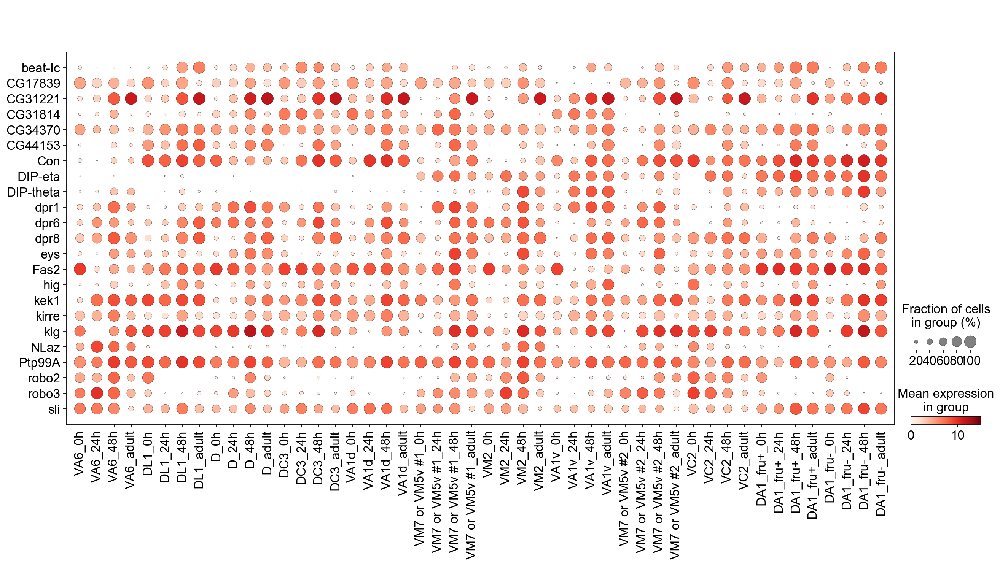

In [22]:
sc.set_figure_params(dpi_save=300, fontsize=18)
fig = sc.pl.dotplot(adata_dup, var_names=common_CSMs, groupby='matched_type_with_stage', swap_axes=True, 
                    vmax=15)#, save='common_CSMs.pdf')

In [23]:
common_TFs = list(set(shared_12).intersection(TFs))
common_TFs = sorted(common_TFs, key=lambda s: s.lower())
len(common_TFs)

17

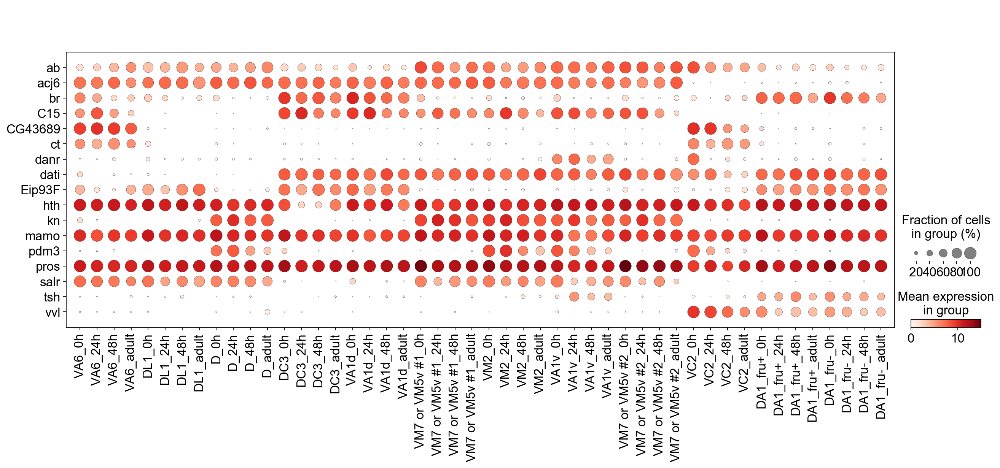

In [57]:
sc.pl.dotplot(adata_dup, var_names=common_TFs, groupby='matched_type_with_stage', swap_axes=True, 
              vmax=15, save='common_TFs.pdf')

# plot union gene sets

In [74]:
union_DE = set.union(DE_0h,DE_24h,DE_48h,DE_adult)
union_CSMs = set(CSMs).intersection(union_DE)
union_TFs = set(TFs).intersection(union_DE)

In [76]:
union_CSMs_order = sorted(list(union_CSMs), key=lambda s: s.lower())
union_TFs_order = sorted(list(union_TFs), key=lambda s: s.lower())

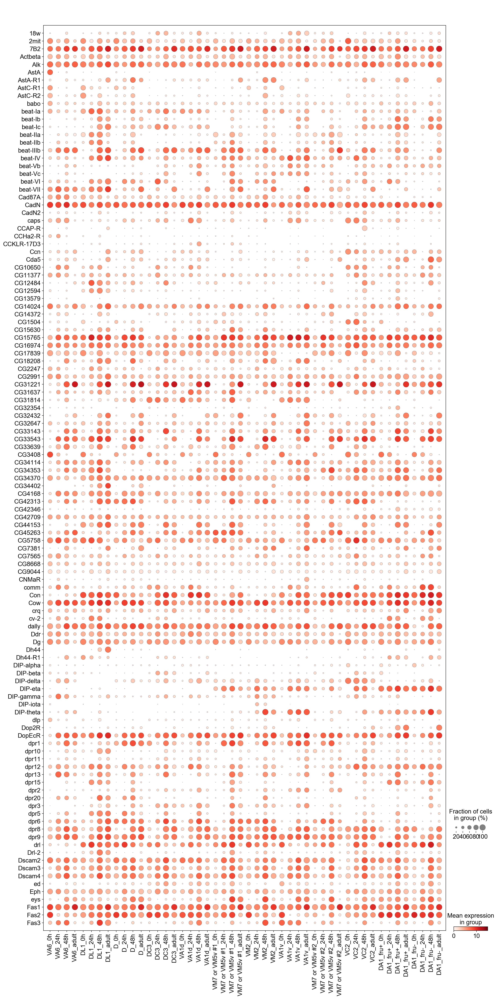

In [77]:
sc.pl.dotplot(adata_dup, var_names=union_CSMs_order[:115], groupby='matched_type_with_stage', swap_axes=True, 
              vmax=15, save='union_CSM_1.pdf')

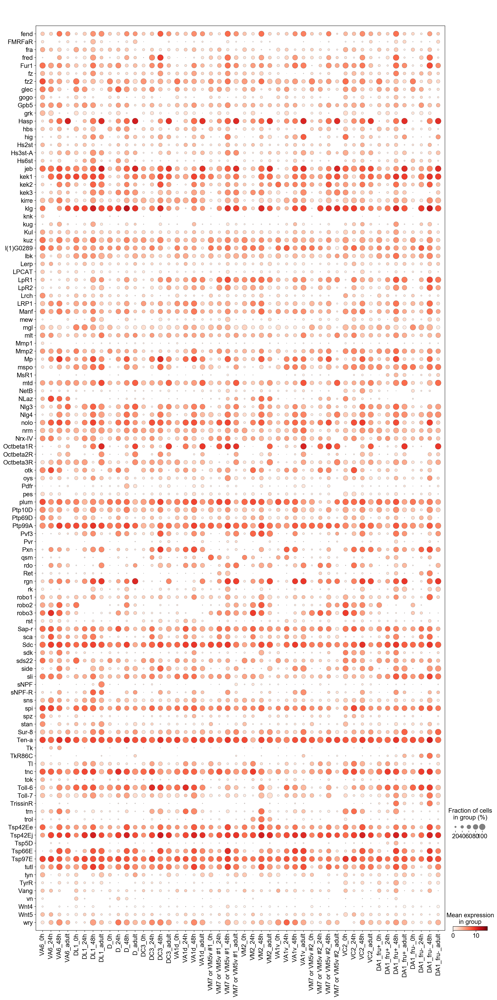

In [78]:
sc.pl.dotplot(adata_dup, var_names=union_CSMs_order[115:], groupby='matched_type_with_stage', swap_axes=True, 
              vmax=15, save='union_CSM_2.pdf')

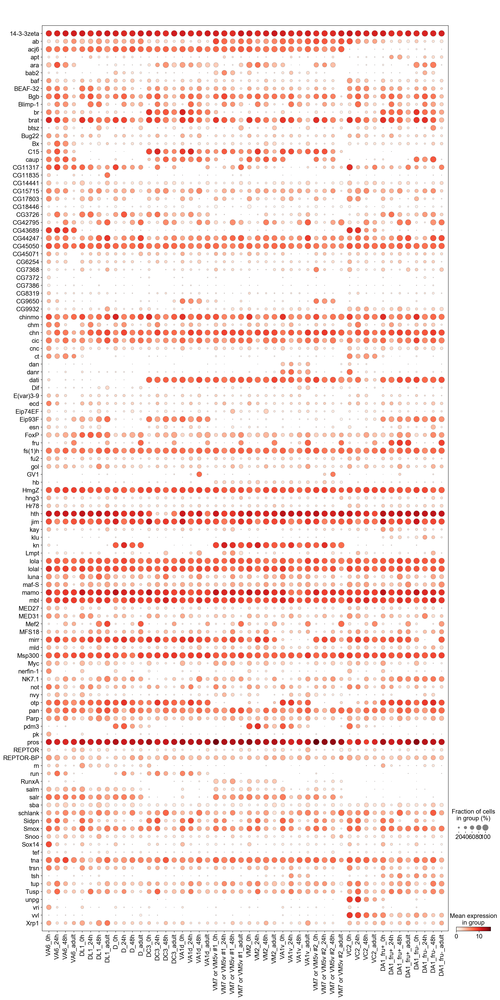

In [79]:
sc.pl.dotplot(adata_dup, var_names=union_TFs_order, groupby='matched_type_with_stage', swap_axes=True, 
              vmax=15, save='union_TFs.pdf')